# Title: Analysis of Crime and Economic Status in Toronto Neighbourhoods (2016-2021)

# 1. Motivation

Toronto is known as one of Canada’s most diverse and economically significant cities, with rapidly growing financial, technological, and cultural sectors. However, there exist income disparities across Toronto neighbourhoods, which may contribute to the varying crime rates. A factor contributing to the city of Toronto’s cycles of poverty and crime may be attributed to existing structural inequalities, such as lack of affordable housing, unemployment, and limited educational opportunities.

Thus, our group’s motivation for investigating the correlation between criminal activity and economic status in Toronto’s neighbourhoods stems from our concern regarding these structural inequalities and interest in exploring other possible underlying factors. Understanding the relationship between economic hardship and crime can provide valuable insights into how economic conditions contribute to rates of criminal activity and inform us on areas that may require policy intervention.

# 2. Review of Similar Research

The relationship between crime rates and poverty is intricate, as areas with lower socio-economic status are often more likely to experience higher criminal activity. According to Statistics Canada, the violent crime severity index was 41 percent higher in 2023 compared to 2014, with a reported surge in Canada’s largest urban centres (Lau, 2024). Toronto is reported to be facing a poverty epidemic, with residents facing both social and economic crises. A 2021 census showed that 13.2% of all Torontonians live in poverty, with higher levels being among immigrants and racialized individuals, especially those from Indigenous communities (Social Planning Toronto, n.d.). While poverty levels seem more concentrated in the downtown region, they are unevenly distributed across the city. These data sources highlight that Toronto is experiencing both rising crime rates and persistent economic inequality.

The Government of Canada (2022) presents research from criminology studies, confirming a strong association between social and economic disadvantage and crime. Research in North America and Europe has utilized data mapping and analysis techniques to investigate this relationship. Data indicate that offenders involved in serious offences like assault, robbery, and homicide are often unemployed or employed in low-paying, unskilled jobs. Furthermore, Ley and Smith’s (2000) research, cited by the Government of Canada, demonstrates an association between crime and social deprivation, finding that higher crime areas in central Toronto align closely with the most economically deprived neighbourhoods. Overall, areas with higher criminal activity tend to have lower socio-economic status, less stable residential communities, higher population densities, and specific land usage patterns that may create more opportunities for crime.

Using data from 2012 to 2021, Mohammadi et al. (2022) conducted a study identifying patterns between homicide rates and various socio-economic and environmental factors across Toronto neighborhoods. Employing spatial analysis techniques like Geographically Weighted Regression (GWR) and Empirical Bayes Smoothing, they found significant clustering of high homicide rates in the downtown and northwest parts of the city. These clusters were potentially attributed to factors such as population density, material deprivation, and the density of commercial establishments. While our study does not replicate these specific spatial techniques, we similarly analyze diverse datasets and apply statistical modelling to explore crime distribution patterns in relation to socioeconomic factors.

# 3. Research Question

Taking our motivations and the existing research into considerations, our group formulated the following research question:

**What is the relationship between household income levels and crime rates across Toronto neighborhoods, and how do these trends vary by type of crime?**

# 4. Data

## 4.1 Data Sources and Features

This research utilizes data retrieved from Toronto’s Open Data Portal, the official source for open data from city divisions and agencies.

*   **Crime Data:**
    *   Source: Dataset `Neighbourhood Crime Rates`, published by the Toronto Police Services.
    *   Features: Recorded crime counts for assault, auto theft, break and enter, robbery, theft over $5000, homicide, and shooting/firearm discharges. Crime rates per 100,000 population, calculated by Environics Analytics, are also included.
    *   File: `raw_data/neighbourhood-crime-rates - 4326.csv` (as indicated in the original notebook structure)

*   **Socioeconomic Data:**
    *   Source: Dataset `Neighbourhood Profiles`, published by Social Development, Finance & Administration. This data is derived from the Census of Population (conducted every five years), collecting demographic, social, and economic data for residents and households in each Toronto neighbourhood.
    *   Files: `raw_data/neighbourhood-profiles-2016-140-model.csv` and `raw_data/neighbourhood-profiles-2021-158-model.csv` (as indicated in the original notebook structure)
    *   Key Features Used: Population counts, age distributions (youth, working age, senior ratios), average/median age, various income metrics (median, average, pre-tax, after-tax for 2020), low-income status percentage.

We will primarily focus on the relationship between income indicators (like `Median_Income_2020`, `Average_Income_2020`, `Median_After_Tax_Income_2020`, `Average_After_Tax_Income_2020`) and crime counts/rates for Assault, Auto Theft, Bike Theft, Break and Enter, Robbery, Theft from Motor Vehicle, and Theft Over $5000 for the years 2016 and 2021 where available and comparable.

## 4.2 Data Quality Assessment and Preparation

Several data preparation steps were undertaken to ensure data quality and enable meaningful comparison between the 2016 and 2021 datasets. The cleaning and preparation logic is encapsulated in Python scripts (`clean_crime_data.py`, `clean_neighborhood_profile_data.py`).

*   **Neighborhood Reconciliation:** Due to boundary changes and naming inconsistencies between the 2016 (140 neighbourhoods) and 2021 (158 neighbourhoods) profile datasets, a reconciliation process was applied. This involved standardizing names (e.g., removing abbreviations, handling variations like 'St.' vs. 'St') and matching neighbourhoods across the years. The goal was to create consistent geographic units for comparison. The final analysis focuses on neighbourhoods present and consistently identifiable in both datasets. *Initial analysis suggested 120 common neighborhoods, though the final analytical dataset mentioned in the report text contains 122 neighborhoods with complete data after handling missing values.*

*   **Data Cleaning:**
    *   Missing Values: Missing crime counts were imputed with zeros where appropriate (assuming no report means zero incidents for that period). Demographic variables with missing data were handled carefully; rows with critical missing information might be excluded if reliable imputation wasn't feasible.
    *   Column Selection: Only relevant columns for the analysis (identifiers, demographic features, income metrics, crime counts/rates) were retained.

*   **Variable Transformation:** Derived variables were created as needed during analysis, particularly for comparing changes over time (though the primary analysis focuses on separate models for 2016 and 2021). Key variables used directly from the cleaned datasets include population totals, age ratios, income metrics, and crime counts/rates per type.

The final datasets used for modeling were merged versions of the cleaned crime and profile data for each respective year (2016 and 2021).

## 4.3 Descriptive Statistics Overview

The final dataset used for analysis covers Toronto's diverse neighborhoods, showing substantial variation in both demographic characteristics and crime rates between 2016 and 2021.

*(Note: The statistics below are cited from the provided text report and reflect the state of the data after cleaning and merging for the analytical sample, likely the 122 neighbourhoods with complete data.)*

*   **Population:** Neighbourhood populations vary significantly, ranging from approximately 6,000 to 85,000 residents. The mean population per neighbourhood increased slightly from ~22,135 in 2016 to ~22,940 in 2021.
*   **Low Income:** The average percentage of residents classified as low income across analyzed neighbourhoods decreased from 19.5% in 2016 to 12.3% in 2021. *(Note: This reflects the specific definition of 'low income' used in the census data).*
*   **Crime:** Total crime counts per neighbourhood exhibit high variability. The mean number of total reported incidents (across the analyzed crime types) per neighbourhood was approximately 298 in 2016 and increased slightly to 312 in 2021. Specific crime types showed different trends (e.g., Auto Theft counts increased significantly on average, while Robbery counts decreased).
*   **Improvement Areas:** 25 neighbourhoods (approx. 14.2% of the original set, percentage might differ slightly for the final 122 sample) were designated as Neighbourhood Improvement Areas (NIAs), a status consistent across both periods in the source data.

These descriptive statistics highlight the dynamic nature of Toronto's neighbourhoods and provide context for the subsequent modeling efforts.

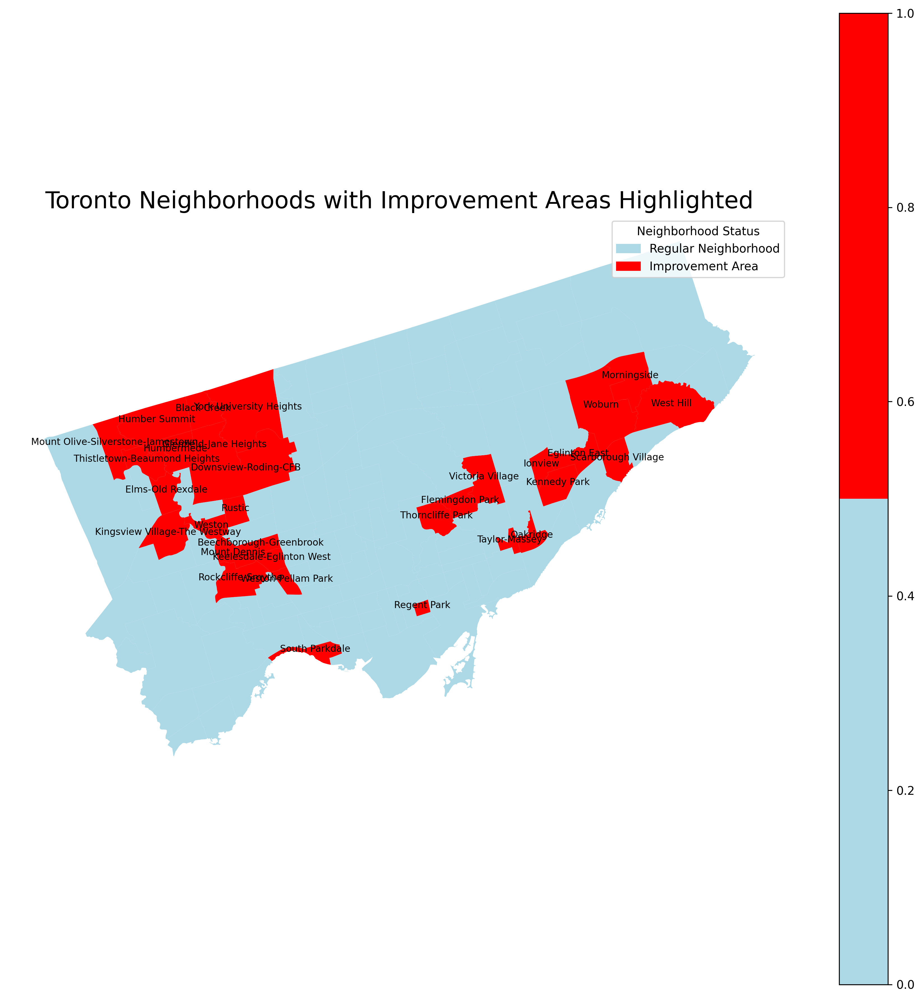

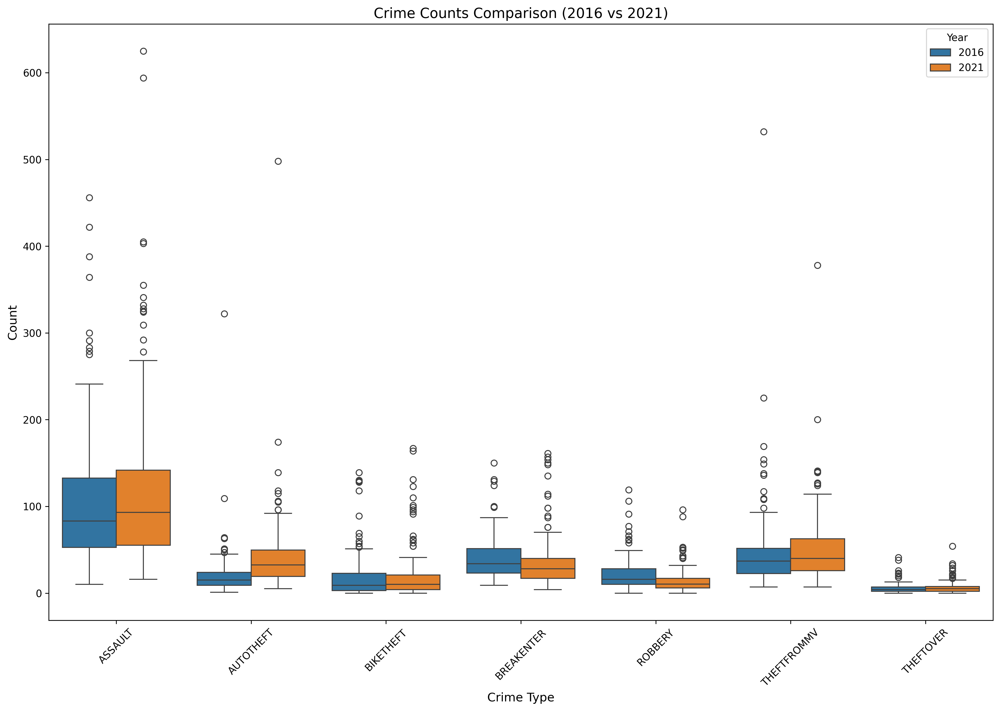

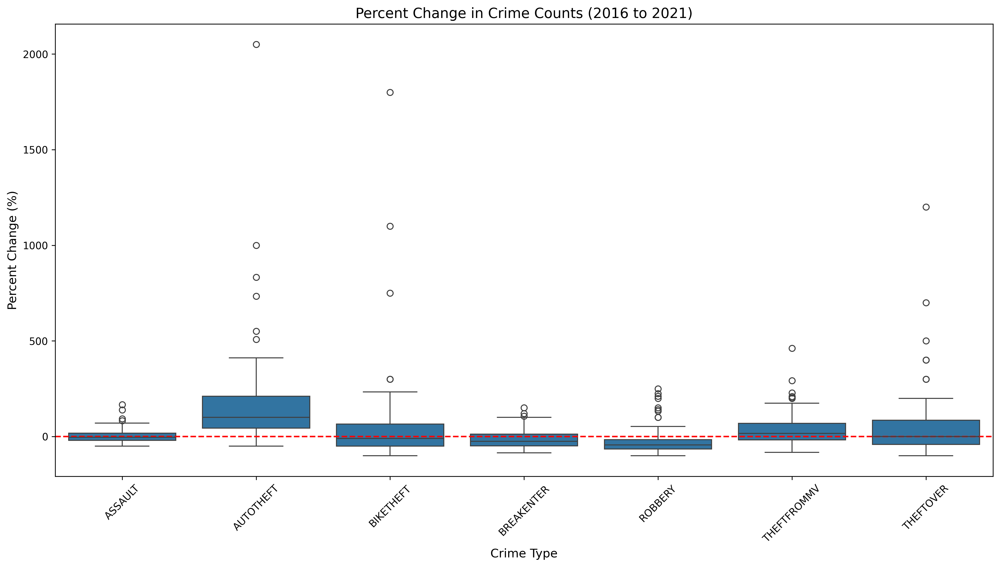

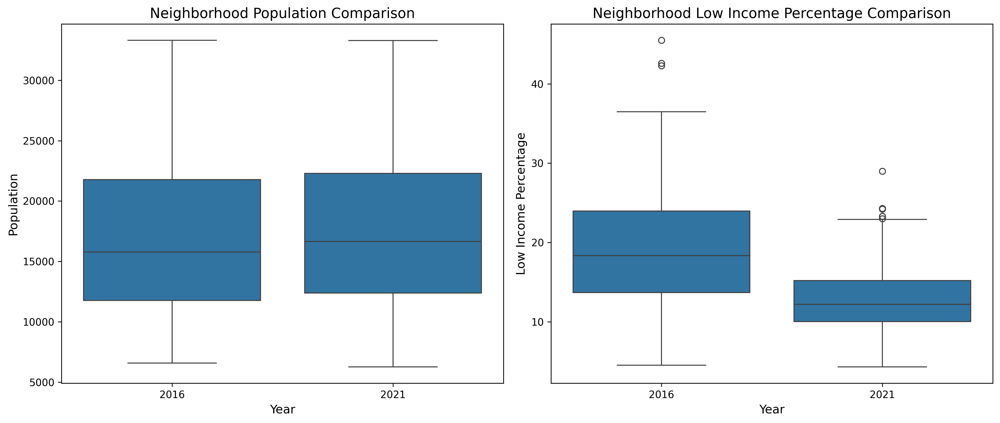

In [1]:
from IPython.display import Image, HTML, display

# Display map of Neighbourhood Improvement Areas
display(HTML("<h3>Neighbourhood Improvement Areas Map</h3>"))
display(Image(filename='output/toronto_neighborhoods_improvement_areas.png', width=800))
# Link to interactive version (optional, requires user interaction)
# display(HTML('<a href="output/toronto_neighborhoods_improvement_areas_interactive.html" target="_blank">View Interactive Map</a>'))

# Display comparison plots from box_plot directory
display(HTML("<h3>Descriptive Comparisons (2016 vs 2021)</h3>"))
display(Image(filename='output/box_plot/crime_counts_comparison.png', width=800))
display(Image(filename='output/box_plot/crime_percent_change.png', width=800))
display(Image(filename='output/box_plot/population_income_comparison.png', width=800))

# 5. Methodology

This section details the analytical approach used to investigate the relationship between household income levels and crime rates across Toronto neighborhoods, addressing the research question. The methodology employs Python for data processing, exploratory data analysis (EDA), and statistical modeling.

## 5.1 Overall Approach

Our study uses a quantitative approach, primarily employing statistical analysis to examine correlations and predictive relationships between socioeconomic variables (especially income) and crime metrics (counts and rates). We analyze data from two distinct time points (2016 and 2021) to understand potential changes in these relationships.

## 5.2 Data Processing and Analysis Workflow

The workflow involved several stages, executed via Python scripts:

1.  **Data Cleaning:** As described in Section 4.2, raw data from Toronto Open Data was cleaned and standardized using `clean_crime_data.py` and `clean_neighborhood_profile_data.py`. This produced consistent datasets for 2016 and 2021.
2.  **Data Merging:** The cleaned crime and neighbourhood profile datasets were merged for each year based on standardized neighbourhood names to create comprehensive analytical datasets (`merged_2016.csv`, `merged_2021.csv` - *assuming these are outputs or intermediate files*).
3.  **Exploratory Data Analysis (EDA):** Visual and statistical exploration was conducted to understand data distributions, identify outliers, check for inconsistencies, and spot potential relationships. This was performed using scripts like `box_plot_2016.py`, `box_plot_2021.py` (visualizing income-crime relationships), `correlational_matrix.py` (generating correlation matrices), and `create_visualizations.py` (creating various summaries).
4.  **Statistical Modeling:** Based on EDA findings, linear regression was chosen as the primary modeling technique. This was implemented in `lin_reg.py` using the `scikit-learn` library.
5.  **Results Interpretation:** Model outputs (R² scores, coefficients) and visualizations (scatter plots, actual vs. predicted plots) were analyzed to answer the research question.

## 5.3 Justification of Analytical Methods

**Exploratory Data Analysis (EDA):** EDA was crucial for hypothesis generation and model selection.
*   *Box Plots:* Used to visually compare crime distributions across income quartiles and identify potential trends or shifts between 2016 and 2021.
*   *Correlation Matrices:* Provided a quantitative overview of the linear relationships between various socioeconomic indicators (population, age structure, income) and different crime types (counts and rates). This helped identify which variables showed the strongest associations.
*   *Other Visualizations:* Scatter plots and potentially maps (like the heatmap mentioned later) helped understand spatial patterns and direct relationships between key variables (e.g., low income percentage vs. crime count).

**Linear Regression:**
While initial EDA suggested that the relationship between income and *normalized crime rates* might be weaker or more complex than anticipated, multivariate linear regression was chosen for the following reasons:
*   **Framework for Hypothesis Testing:** It provides a standard framework to test whether income variables remain statistically significant predictors of crime variation, even if correlations are weak, while controlling for other factors (like population and age structure).
*   **Interpretability:** Linear regression coefficients offer relatively straightforward interpretations of the relationship between each predictor and the outcome variable, assuming model assumptions are reasonably met.
*   **Baseline Model:** It serves as a well-understood baseline model. Findings can guide future research towards more complex models if necessary.
*   **Handling Multivariate Complexity:** EDA indicated that no single variable dominated across all crime types. Regression allows for assessing the combined and partial effects of multiple predictors simultaneously.

Therefore, linear regression was used not necessarily to build the *best possible* predictive model, but to systematically test the specific contribution of income and demographic factors to crime variation within a clear, interpretable framework. Models were run separately for crime counts and crime rates, as EDA suggested different patterns.


Linear regression relies on several key assumptions:

*   **Linearity:** Assumes a linear relationship between predictors and the outcome. EDA suggested this was more plausible for crime *counts* (which often scale with population-related predictors) than for crime *rates*. Visual inspection of scatter plots and residual plots (if generated) would be needed for a formal check. Where linearity was weak (especially for rates), the model might underfit.
*   **Independence:** Assumes observations are independent. This might be violated if spatial autocorrelation exists (nearby neighbourhoods influencing each other), which was not explicitly modeled.
*   **Homoscedasticity:** Assumes constant variance of errors. Checked visually using residual plots.
*   **Normality of Errors:** Assumes errors are normally distributed. Checked using histograms or Q-Q plots of residuals.

**Model Fit (R²):**
As noted in the report text and visualized in plots like `r_squared_comparison_2016.png` (and presumably a similar one for 2021):
*   R² scores were generally higher for models predicting crime *counts* compared to crime *rates*. For instance, the 2016 Assault count model reportedly achieved R² ≈ 0.50, while the rate model was ≈ 0.31. Break and Enter showed an even larger gap (count R² > 0.42 vs. rate R² < 0.07).
*   This suggests that the included demographic and income variables (especially population) explain a considerable portion of the *volume* of crime but are less effective at explaining the *risk* of crime per capita (rates). Crime rates likely depend more on other localized factors not captured in this model (e.g., specific land use, policing strategies, social cohesion, factors not included in census profiles).

**Limitations:**
*   **Model Specification:** The chosen linear model might be too simple if true relationships are non-linear or involve complex interactions.
*   **Omitted Variable Bias:** Important factors influencing both income and crime might be missing from the model (e.g., detailed land use, specific policing activities, social program availability, educational attainment levels beyond age ratios), leading to potentially biased coefficient estimates.
*   **Ecological Fallacy:** Findings at the neighbourhood level do not necessarily apply to individuals within those neighbourhoods.
*   **Data Limitations:** As mentioned in Section 4.4 (boundary changes, potential COVID-19 impact on 2021 data, reporting variations, measurement error in income/crime data).
*   **Temporal Granularity:** Uses census data (every 5 years) and potentially aggregated crime data, missing finer temporal dynamics.

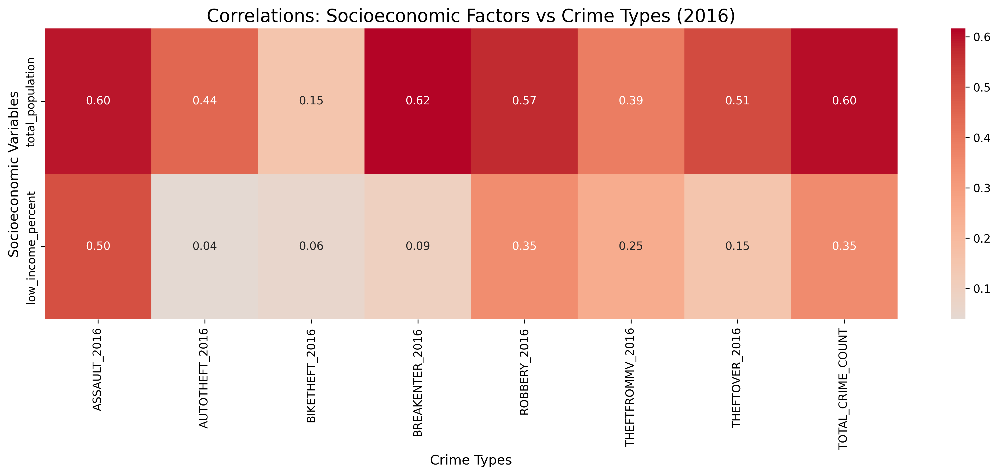

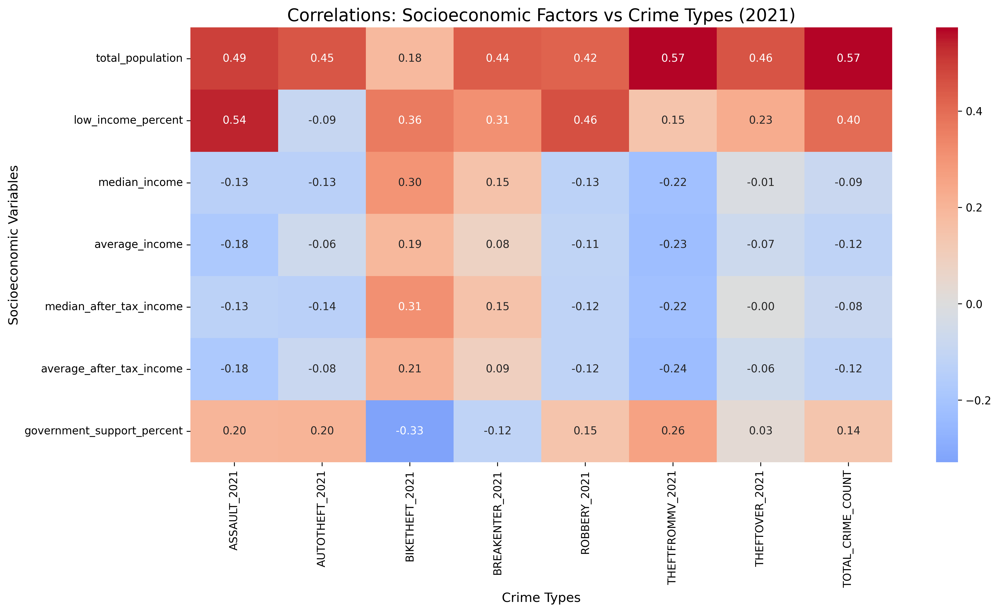

In [2]:
from IPython.display import Image, HTML, display

# Display correlation matrices
display(HTML("<h3>Correlation Matrices</h3>"))
display(HTML("<h4>2016 Socioeconomic Factors vs Crime</h4>"))
display(Image(filename='output/correlational_matrix/socio_crime_correlation_2016.png', width=800))
display(HTML("<h4>2021 Socioeconomic Factors vs Crime</h4>"))
display(Image(filename='output/correlational_matrix/socio_crime_correlation_2021.png', width=800))
# display(HTML("<h4>Change in Correlations (2021 vs 2016)</h4>")) # Optional: Change matrix
# display(Image(filename='output/correlational_matrix/socio_crime_correlation_change.png', width=800))

# Display additional EDA plots if relevant (e.g., specific crime comparisons)
# display(HTML("<h4>Assault Counts in Improvement Areas vs Non-Improvement Areas</h4>"))
# display(Image(filename='output/box_plot/improvement_area_assault_comparison.png', width=600))

## 5.4 Implementation of Statistical Techniques

Linear regression models were implemented using the `LinearRegression` class from Python's `scikit-learn` library within the `lin_reg.py` script.

*   **Model Structure:** For each crime type (Assault, Auto Theft, etc.) and for both crime counts and crime rates, separate multivariate linear regression models were estimated for 2016 data and 2021 data.
    *   **Dependent Variables (Targets):** Crime Count (e.g., `ASSAULT_2016`, `ASSAULT_2021`) or Crime Rate (e.g., `ASSAULT_RATE_2016`, `ASSAULT_RATE_2021` - *assuming rates were calculated and included*).
    *   **Independent Variables (Predictors):** A consistent set of demographic and socioeconomic variables was used across models:
        *   `'Total_Population'`
        *   `'Youth_Ratio'`
        *   `'Working_Age_Ratio'`
        *   `'Senior_Ratio'`
        *   `'Average_Age'`
        *   `'Median_Age'`
        *   Income metrics available for the respective year (e.g., `'Median_Income_2020'`, `'Average_Income_2020'`, `'Median_After_Tax_Income_2020'`, `'Average_After_Tax_Income_2020'` used for 2021 models; corresponding 2016 income metrics for 2016 models). *Note: The text specifically lists 2020 income metrics, likely from the 2021 census data.*

*   **Implementation Process:**
    1.  Relevant predictor and target variables were extracted for each crime type/metric combination.
    2.  A `LinearRegression` model was instantiated and fitted (`model.fit(X, y)`).
    3.  Model performance was evaluated primarily using the R² score (coefficient of determination), indicating the proportion of variance in the dependent variable explained by the predictors.
    4.  Model coefficients were extracted to understand the direction and magnitude of relationships.
    5.  Visualizations were generated to aid interpretation and validate assumptions (e.g., scatter plots of key relationships, actual vs. predicted plots to assess fit).
    6.  Results (R² scores, coefficients) were compiled, potentially into summary files (like `regression_summary_2016.csv`) and comparison plots (like `r_squared_comparison_2016.png`, `crime_counts_regression.png`, `crime_rates_regression.png`).

This systematic approach allowed for comparing model performance across crime types, between counts and rates, and between the two years (2016 and 2021).

## 5.5 Evaluation of Model Assumptions and Limitations

Linear regression relies on several key assumptions:

*   **Linearity:** Assumes a linear relationship between predictors and the outcome. EDA suggested this was more plausible for crime *counts* (which often scale with population-related predictors) than for crime *rates*. Visual inspection of scatter plots and residual plots (if generated) would be needed for a formal check. Where linearity was weak (especially for rates), the model might underfit.
*   **Independence:** Assumes observations are independent. This might be violated if spatial autocorrelation exists (nearby neighbourhoods influencing each other), which was not explicitly modeled.
*   **Homoscedasticity:** Assumes constant variance of errors. Checked visually using residual plots.
*   **Normality of Errors:** Assumes errors are normally distributed. Checked using histograms or Q-Q plots of residuals.

**Model Fit (R²):**
As noted in the report text and visualized in plots like `r_squared_comparison_2016.png` (and presumably a similar one for 2021):
*   R² scores were generally higher for models predicting crime *counts* compared to crime *rates*. For instance, the 2016 Assault count model reportedly achieved R² ≈ 0.50, while the rate model was ≈ 0.31. Break and Enter showed an even larger gap (count R² > 0.42 vs. rate R² < 0.07).
*   This suggests that the included demographic and income variables (especially population) explain a considerable portion of the *volume* of crime but are less effective at explaining the *risk* of crime per capita (rates). Crime rates likely depend more on other localized factors not captured in this model (e.g., specific land use, policing strategies, social cohesion, factors not included in census profiles).

**Limitations:**
*   **Model Specification:** The chosen linear model might be too simple if true relationships are non-linear or involve complex interactions.
*   **Omitted Variable Bias:** Important factors influencing both income and crime might be missing from the model (e.g., detailed land use, specific policing activities, social program availability, educational attainment levels beyond age ratios), leading to potentially biased coefficient estimates.
*   **Ecological Fallacy:** Findings at the neighbourhood level do not necessarily apply to individuals within those neighbourhoods.
*   **Data Limitations:** As mentioned in Section 4.4 (boundary changes, potential COVID-19 impact on 2021 data, reporting variations, measurement error in income/crime data).
*   **Temporal Granularity:** Uses census data (every 5 years) and potentially aggregated crime data, missing finer temporal dynamics.

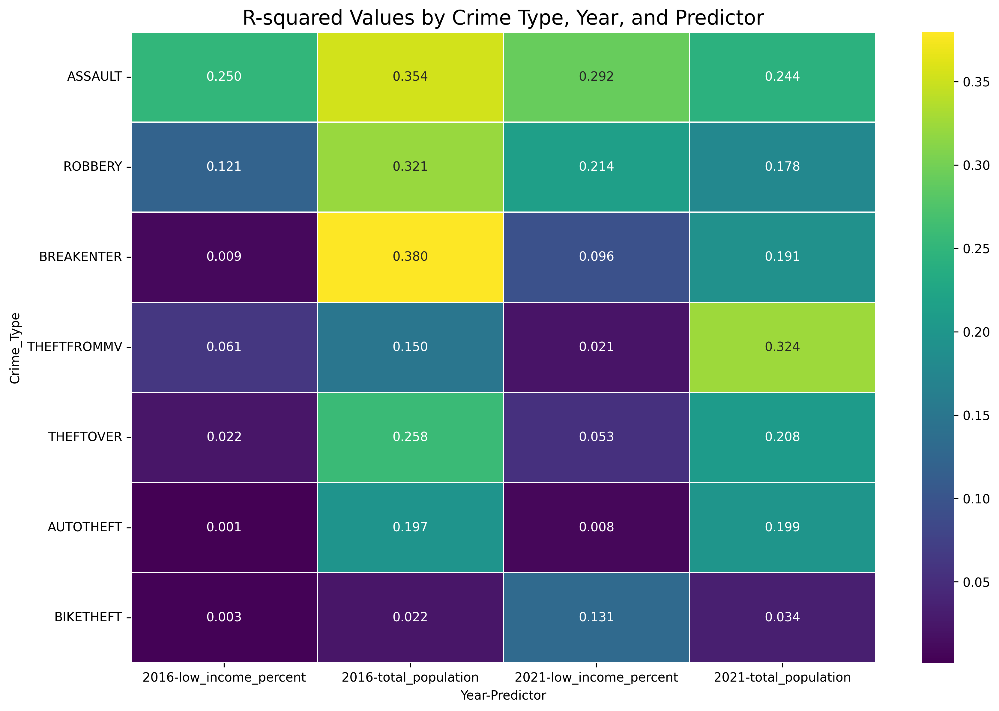

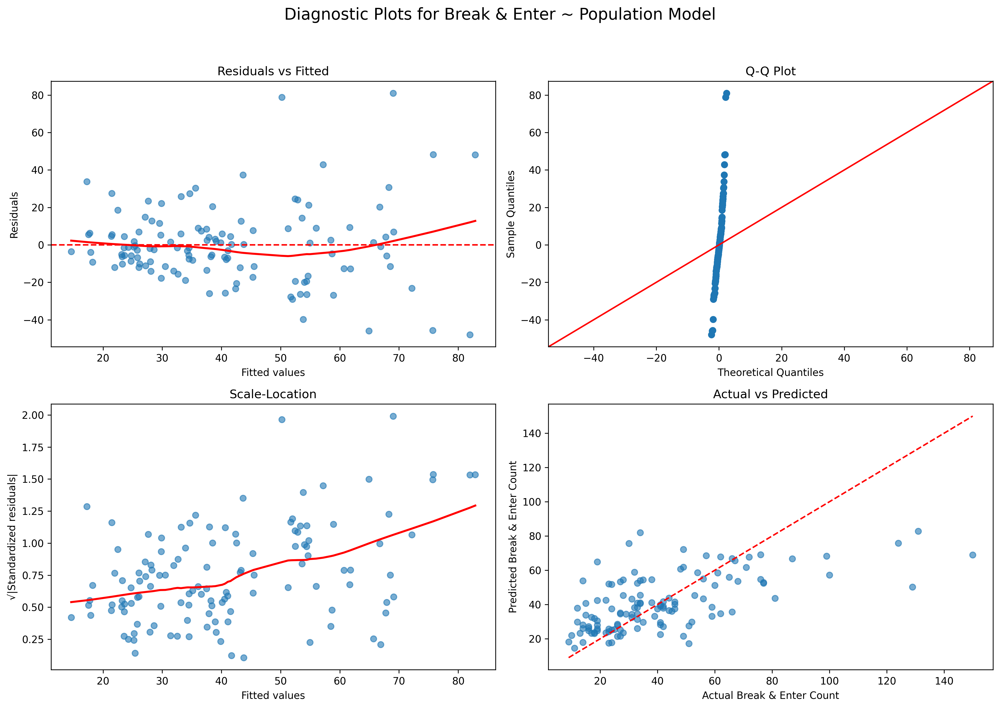

In [3]:
from IPython.display import Image, HTML, display

# Display R-squared heatmap (from linear regression fitness)
display(HTML("<h3>Model Fitness Overview (R-squared Heatmap - Linear Models)</h3>"))
display(Image(filename='output/fitness/r_squared_heatmap.png', width=700))

# Display general diagnostic plots for linear models
display(HTML("<h3>Example Diagnostic Plots (Linear Models)</h3>"))
display(Image(filename='output/model_check/diagnostic_plots.png', width=800)) # General check

# Display R-squared comparisons for Count Models (Poisson/NB) if applicable
# display(HTML("<h3>Model Fitness Overview (Pseudo R-squared - Count Models)</h3>"))
# display(Image(filename='output/count_model_fitness/r_value_comparison.png', width=800)) # Compares different R metrics
# display(Image(filename='output/count_model_fitness/poisson_r_heatmap.png', width=700))
# display(Image(filename='output/count_model_fitness/nb_r_heatmap.png', width=700))

# 6. Analysis and Interpretation of Results

This section presents the key findings from the exploratory data analysis and linear regression models, interpreting them in the context of the research question.

*(Note: This section relies heavily on visualizations generated by the scripts. The interpretations below are based on the descriptions provided in the `INF412 final project report.txt`.)*

## 6.1 Visual Exploration Highlights

*   **Low Income vs. Total Crime Scatter Plot:**
    *   A scatter plot comparing the percentage of low-income residents against total crime counts showed a general positive trend: neighbourhoods with higher percentages of low-income residents tended to have higher total crime counts.
    *   The report suggests the trend line for 2021 was steeper and showed a stronger correlation compared to 2016, potentially indicating a strengthening relationship between the low-income measure and crime volume over this period. *(Visual confirmation via the actual `_scatter_plots.png` or similar plots needed).*

*   **R-squared Comparisons (e.g., `r_squared_comparison_2016.png` & 2021 equivalent):**
    *   These bar charts compare the R² values across different crime types for both count-based and rate-based models.
    *   Consistent Finding: Crime *count* models generally had higher R² values than crime *rate* models across both years. This reinforces that population size and basic demographics are strong drivers of the *number* of crimes but less so for the *per capita risk*.
    *   Year Comparison: The report notes mixed results when comparing R² between years. For some crimes (e.g., assault, break-and-enter counts), 2016 models might have had higher R², while for others (overall crime count, some property crimes) and generally for *rate* models, 2021 models showed higher R². This suggests the predictive power of the chosen socioeconomic factors may have shifted differently for various crime types between 2016 and 2021.

*   **Correlation Matrices (e.g., `correlational_matrix.py` output for 2016 & 2021):**
    *   These matrices visualize the linear correlation coefficients between socioeconomic variables and crime metrics.
    *   Key Finding (reported for 2021): `Total_Population` and `low_income_percent` emerged as relatively strong positive predictors for `Total_Crime_Count` and `Assault_Count`.
    *   Interesting Patterns: Bike theft and break-and-enter were noted to be negatively correlated with government support percentage (if included) and positively correlated with low-income percentage. This hints at complex interactions where lack of support in lower-income areas might be a factor, rather than just low income itself. *(Requires careful examination of the specific matrix generated).*

*   **Heatmaps (Geographic Visualization - if generated by `create_visualizations.py`):**
    *   The report describes heatmaps visualizing low-income percentages and crime rates across Toronto neighbourhoods.
    *   Observation: A clear overlap (high low-income percentage correlating with high crime rate) was reportedly evident primarily in the downtown core. Other areas might show high crime *or* high low-income, but not necessarily both strongly, suggesting the relationship is geographically nuanced and influenced by other local factors.

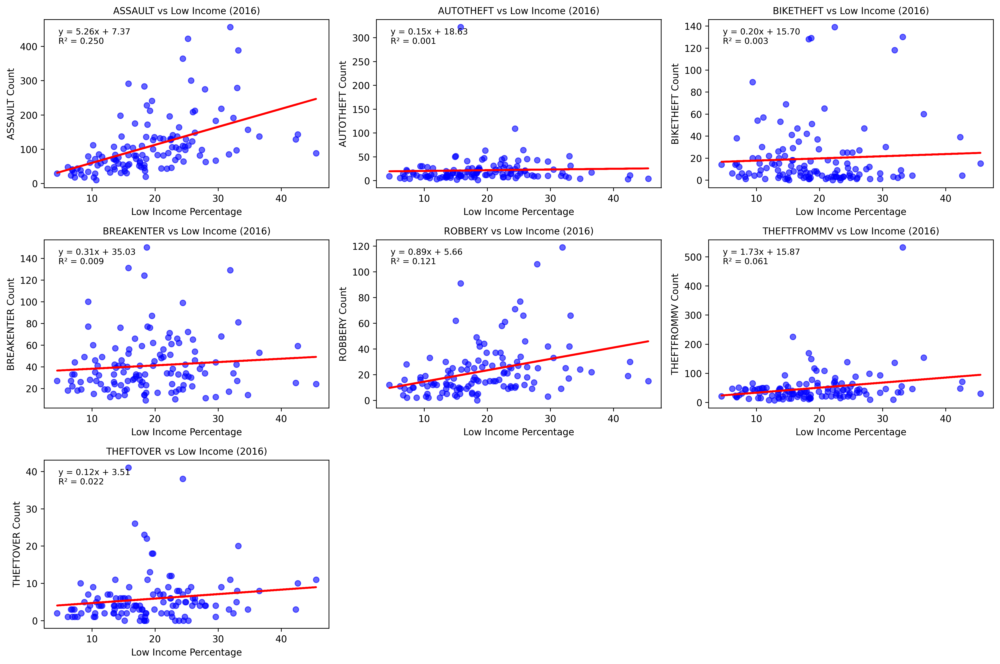

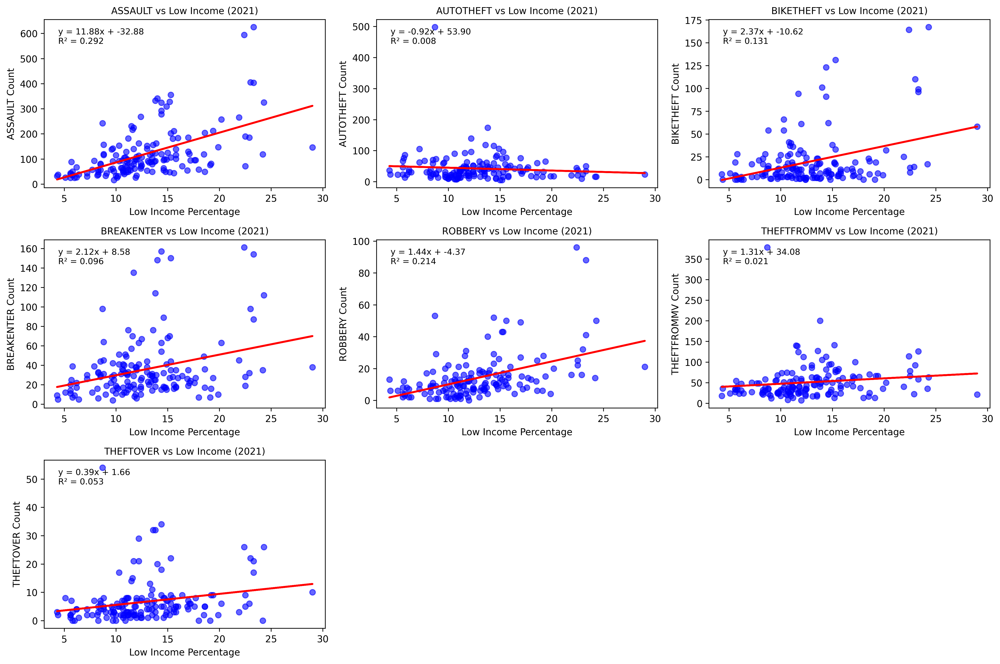

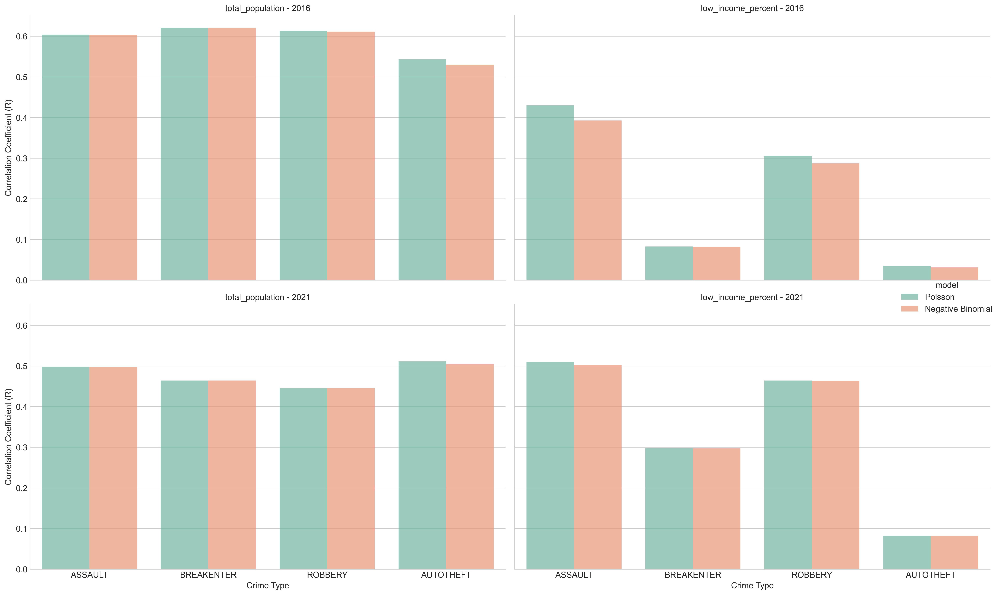

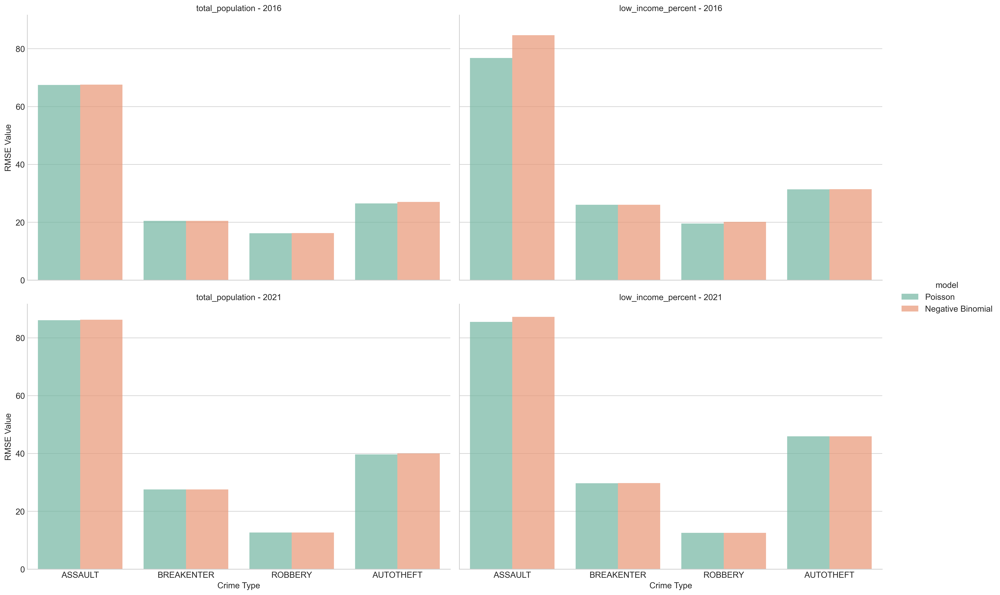

In [4]:
from IPython.display import Image, HTML, display

# Scatter plot: Low Income % vs Crime Counts
display(HTML("<h3>Low Income Percentage vs. Crime Counts</h3>"))
display(Image(filename='output/linear_regression/low_income_vs_crime_2016.png', width=900))
display(Image(filename='output/linear_regression/low_income_vs_crime_2021.png', width=900))

# R-squared and RMSE Comparisons (Count Models)
display(HTML("<h3>Model Performance Comparisons (Count Models)</h3>"))
display(Image(filename='output/count_model_fitness/r_value_comparison.png', width=800))
display(Image(filename='output/count_model_fitness/rmse_comparison.png', width=800))

# Correlation Matrices (repeated for context if desired, or omit if shown in Sec 5.3)
# display(HTML("<h3>Correlation Matrices (Reminder)</h3>"))
# display(Image(filename='output/correlational_matrix/socio_crime_correlation_2016.png', width=800))
# display(Image(filename='output/correlational_matrix/socio_crime_correlation_2021.png', width=800))

# Geographic Heatmap (already shown in Sec 4.3, omit or repeat)
# display(HTML("<h3>Neighbourhood Improvement Areas Map (Reminder)</h3>"))
# display(Image(filename='output/toronto_neighborhoods_improvement_areas.png', width=800))

## 6.2 Regression Model Interpretation

*(Based on descriptions of `crime_counts_regression.png`, `crime_rates_regression.png`, `regression_summary_2016.csv` etc.)*

*   **Predictive Power:** As indicated by R² values, the models were moderately successful at predicting crime *counts* (R² often between ~0.3 and ~0.5, varying by crime type and year), but less successful at predicting crime *rates* (R² often much lower, sometimes below 0.1). This implies that while neighborhood demographics and income levels explain *where* more crime occurs in absolute numbers, they don't fully capture the factors that make certain neighborhoods riskier per person.
*   **Income Coefficients:** The specific coefficients for income variables (e.g., `Median_Income_2020`) need to be examined from the regression output summaries. While EDA suggested positive correlation between *low-income percentage* and crime counts, the regression coefficients for *median/average income* (which have an inverse relationship with poverty) would likely be negative if higher income predicts lower crime, holding other factors constant. The statistical significance (p-values) of these coefficients is crucial – a non-significant coefficient suggests income doesn't add predictive power beyond the other variables in the model. *The report text implies income's predictive power might be weak or inconsistent, especially for rates.*
*   **Other Predictors:** Population size (`Total_Population`) is typically a strong positive predictor of crime *counts*. Age structure variables (`Youth_Ratio`, etc.) likely show varying importance depending on the crime type.

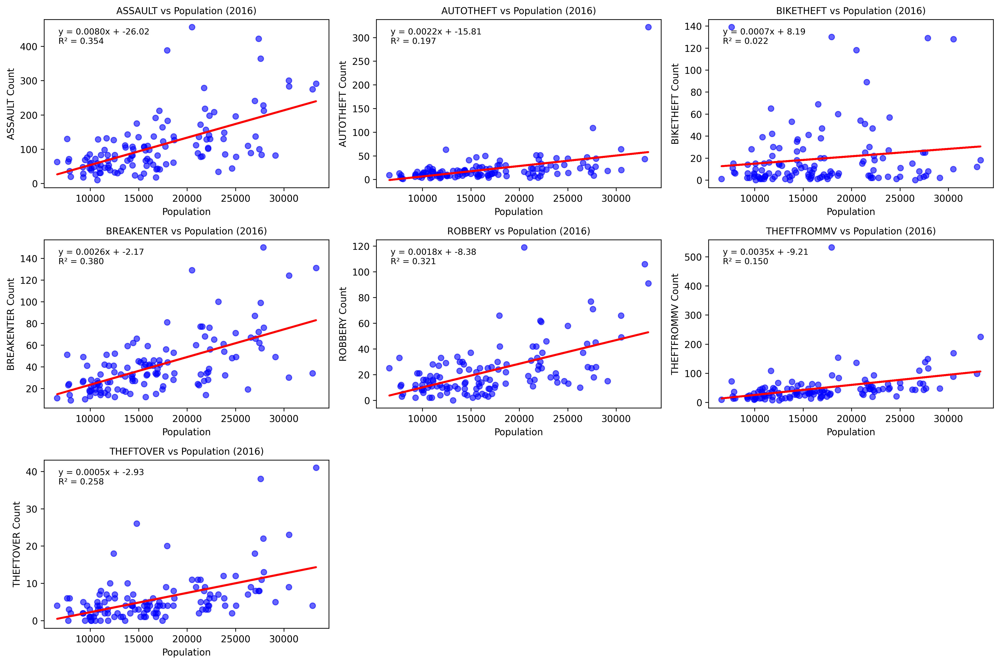

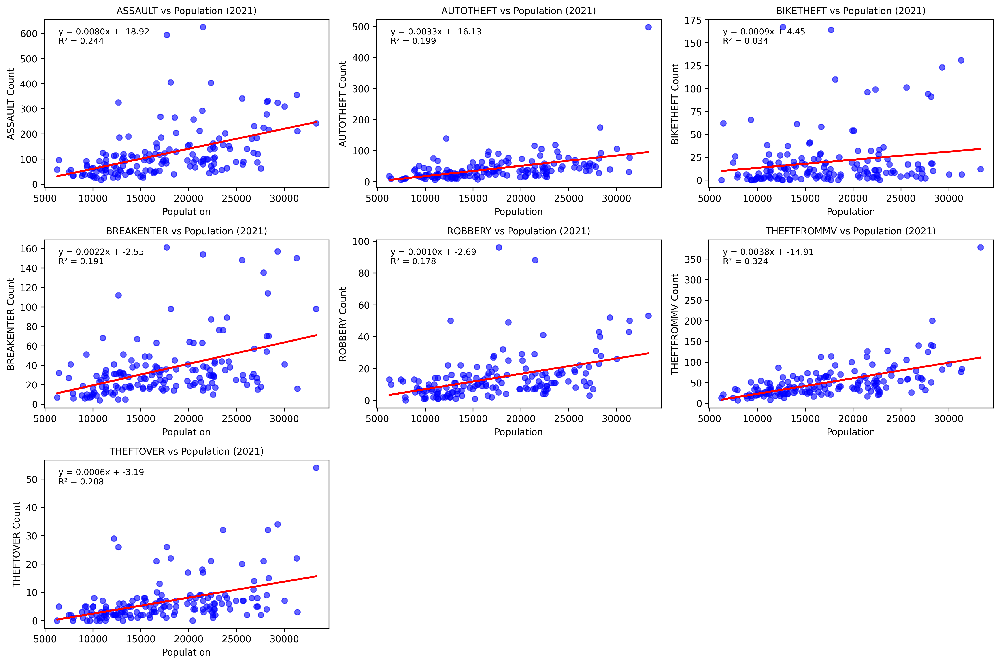

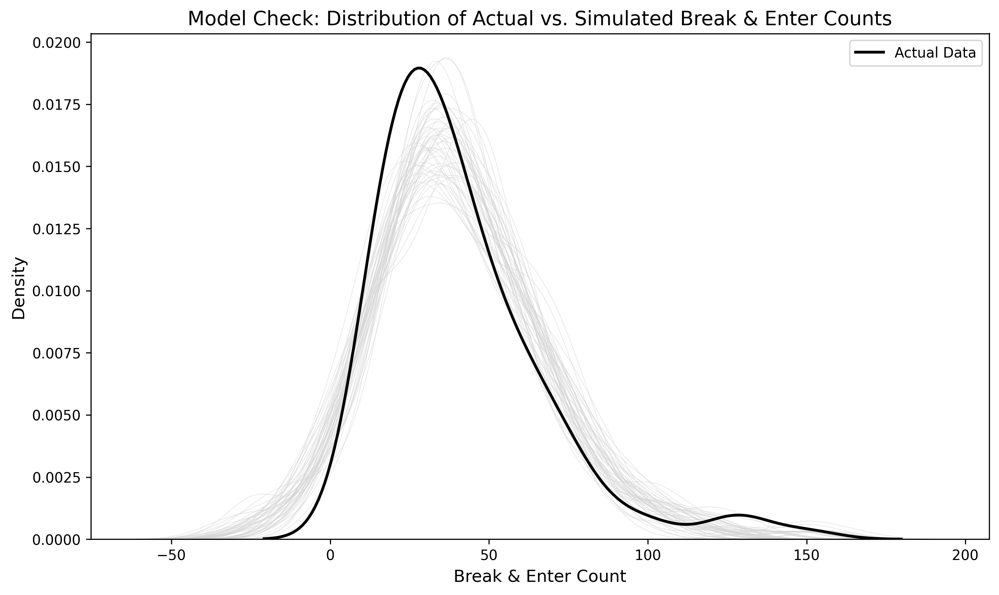

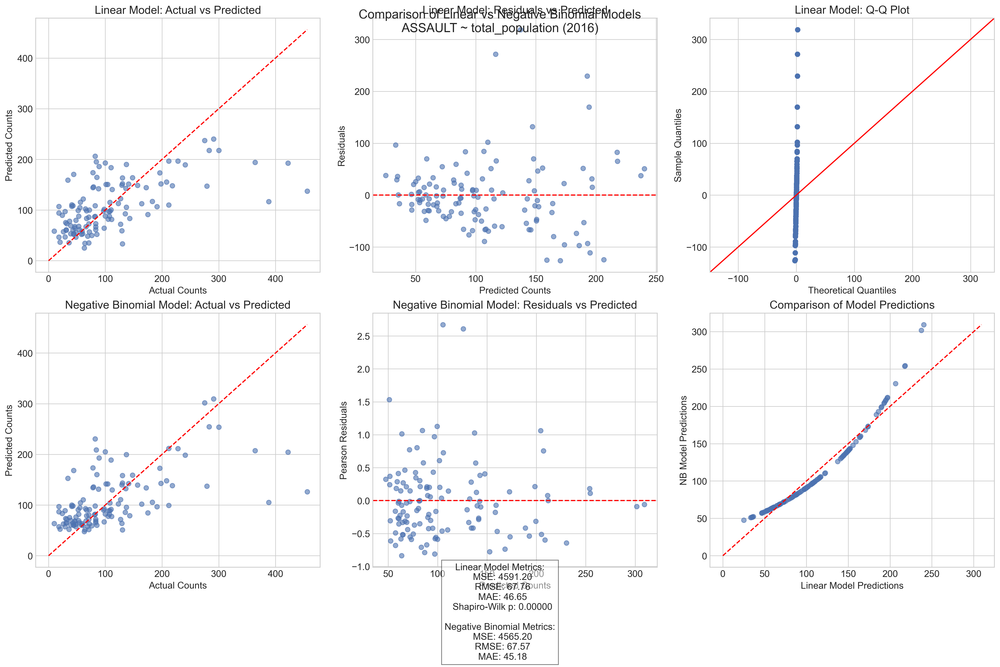

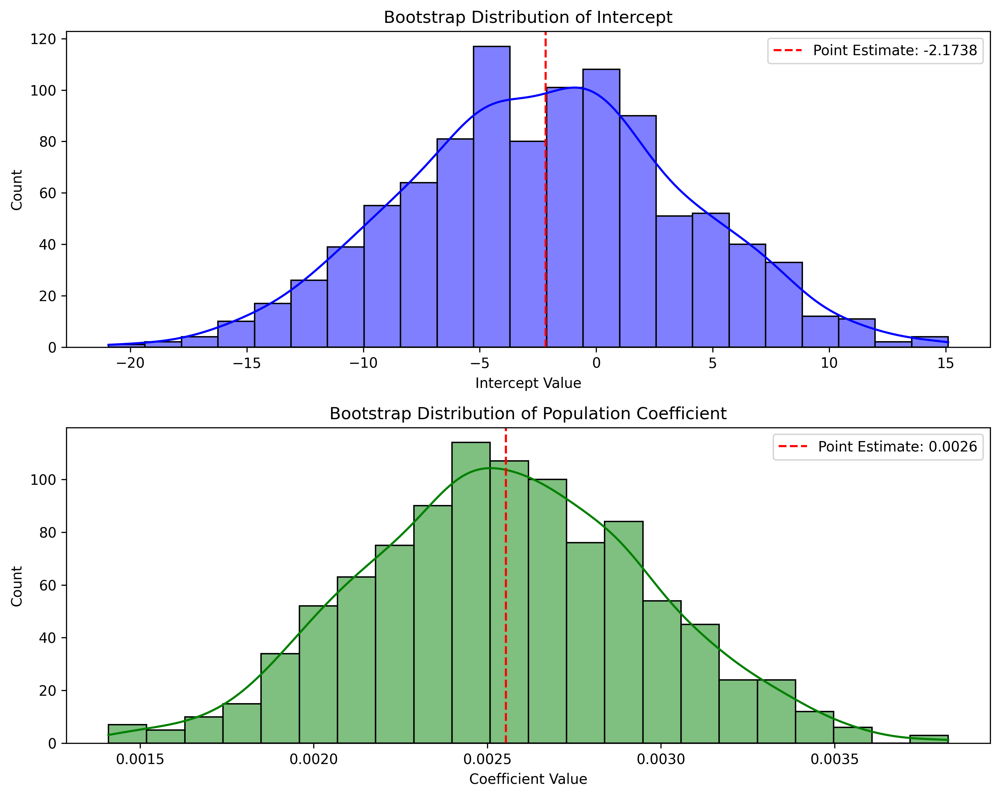

In [5]:
from IPython.display import Image, HTML, display

# Scatter plots: Population vs Crime Counts
display(HTML("<h3>Total Population vs. Crime Counts</h3>"))
display(Image(filename='output/linear_regression/population_vs_crime_2016.png', width=900))
display(Image(filename='output/linear_regression/population_vs_crime_2021.png', width=900))

# Predictive Check / Actual vs Predicted (Linear Model Example)
display(HTML("<h3>Predictive Check Example (Linear Model)</h3>"))
display(Image(filename='output/model_check/predictive_check.png', width=900))

# Model Comparison Plots (Example: Assault, Total Population, 2016)
# Choose representative examples from output/model_comparison or output/count_models
display(HTML("<h3>Model Comparison Example (Assault Count vs Population, 2016)</h3>"))
# Example from linear model comparison plots:
display(Image(filename='output/model_comparison/ASSAULT_total_population_2016_model_comparison.png', width=900))
# Example from count model (Poisson/NB) comparison plots:
# display(Image(filename='output/count_models/ASSAULT_total_population_2016_model_comparison.png', width=900)) # Note: Similar filename, potentially redundant

# Coefficient Uncertainty Plot
display(HTML("<h3>Coefficient Uncertainty (Linear Model Example)</h3>"))
display(Image(filename='output/model_check/coefficient_uncertainty.png', width=800))

## 6.3 Answering the Research Question

**What is the relationship between household income levels and crime rates across Toronto neighborhoods, and how do these trends vary by type of crime?**

Based on the analysis:

1.  There appears to be a positive relationship between measures associated with lower socioeconomic status (like higher low-income percentage) and higher crime *counts* at the neighbourhood level. Conversely, higher average/median income might be associated with lower crime counts, though the strength and significance vary.
2.  This relationship is considerably weaker when looking at crime *rates* (per capita). This suggests that while richer neighbourhoods might have fewer crimes overall (partly due to lower density or other factors correlated with income), the *risk per person* isn't solely determined by the neighbourhood's average income level. Other factors play a significant role in determining rates.
3.  The strength and significance of the income-crime relationship vary by crime type. Some crimes (e.g., potentially assault, certain property crimes) show a clearer link to socioeconomic factors included in the model than others.
4.  There are indications that these relationships may have shifted between 2016 and 2021, with the predictive power of the model changing for different crime types and metrics (counts vs. rates).

**Overall Conclusion from Results:** The analysis suggests that while socioeconomic status, including income, is correlated with crime patterns in Toronto neighbourhoods (especially crime volume), it is not a sole determinant, particularly for per capita crime risk. The relationship is complex, varies by crime type and potentially over time, and interacts heavily with population density and other demographic factors. The included variables provide only a partial explanation, highlighting the need to consider other unmeasured factors.

# 7. Discussion

## 7.1 Limitations

The study's findings should be considered in light of several limitations:

*   **Linear Model Constraints:** Linear regression assumes linear relationships and may not capture complex, non-linear dynamics or threshold effects between socioeconomic factors and crime. The relatively low R² values for crime rates suggest that linear models with the current predictors are insufficient to fully explain crime risk variation.
*   **Omitted Variables:** The models likely suffer from omitted variable bias. Factors not included but potentially correlated with both income and crime (e.g., detailed land use patterns, proximity to transit hubs, specific policing strategies, community-level social capital, educational attainment details, unemployment rates not captured by census income data alone) could significantly influence the observed relationships.
*   **Ecological Fallacy:** Conclusions drawn at the neighbourhood level cannot be reliably extrapolated to individual behavior or risk.
*   **Data Aggregation:** Using aggregated neighbourhood-level data masks variations within neighbourhoods. Census data is collected infrequently (every 5 years), potentially missing short-term economic shifts.
*   **Crime Data Issues:**
    *   **Underreporting:** Official crime statistics only capture reported incidents. Actual crime levels may be higher, and reporting rates might vary systematically across neighbourhoods (e.g., based on trust in police, types of crime), potentially biasing the data.
    *   **Definition Changes:** Changes in crime definitions or recording practices over time could affect comparability.
*   **Temporal Factors:** The comparison between 2016 and 2021 is potentially confounded by unique events, most notably the COVID-19 pandemic, which significantly altered social patterns and likely crime trends in 2021.
*   **Spatial Dependencies:** The analysis does not account for spatial autocorrelation – the possibility that crime levels in one neighbourhood are influenced by those in adjacent neighbourhoods.

## 7.2 Robustness and Future Directions

While the linear regression provides a baseline understanding, the limitations highlight areas for future research to improve robustness:

*   **Advanced Modeling:** Explore non-linear models (e.g., polynomial regression, GAMs) or machine learning techniques (e.g., Random Forests, Gradient Boosting) that can capture more complex relationships and interactions. Employ spatial regression models (like GWR, used by Mohammadi et al., 2022) to explicitly account for geographic dependencies.
*   **Richer Data:** Incorporate additional variables, such as:
    *   Detailed land use data (residential, commercial, industrial mix).
    *   Access to public resources (transit, parks, community centres).
    *   Measures of inequality *within* neighbourhoods (not just average income).
    *   More direct measures of unemployment or economic precarity.
    *   Data on policing deployment or community initiatives.
    *   Potentially, survey data on unreported crime or fear of crime.
*   **Temporal Analysis:** Utilize more granular time-series data if available to better understand short-term dynamics and causality.
*   **Qualitative Research:** Complement quantitative analysis with qualitative studies (e.g., interviews with residents, community leaders, law enforcement in high- and low-crime areas) to understand the lived experiences and mechanisms behind the observed statistical patterns.

**Conclusion:** This study confirms a complex link between socioeconomic status and crime in Toronto neighbourhoods, particularly regarding crime volume. However, the limitations of the data and linear models suggest that income level is only one piece of a larger puzzle. Future research incorporating richer data and more sophisticated methods is needed to fully understand the drivers of crime rates and inform effective, targeted interventions.

# 8. References

1.  Lau, M. (2024). *Numbers don’t lie—crime up significantly in Toronto and across Canada*. Fraser Institute. https://www.fraserinstitute.org/commentary/numbers-dont-lie-crime-up-significantly-in-toronto-and-across-canada
2.  Better Dwelling. (n.d.). *Stat Can: Toronto Takes The Top Spot For The Highest Ratio Of Poverty In Canada*. Retrieved from https://betterdwelling.com/stat-can-toronto-takes-the-top-spot-for-the-highest-ratio-of-poverty-in-canada/ *(Note: Original report cited this URL, verify source reliability)*
3.  Government of Canada, Department of Justice. (2022). *Exploring the link between crime and socio-economic status in Ottawa and Saskatoon: A small-area geographical analysis*. https://www.justice.gc.ca/eng/rp-pr/csj-sjc/crime/rr06_6/p2.html
4.  Mohammadi, A., Bergquist, R., Fathi, G., Pishgar, E., de Melo, S. N., Sharifi, A., & Kiani, B. (2022). Homicide rates are spatially associated with built environment and socio-economic factors: A study in the neighbourhoods of Toronto, Canada. *BMC Public Health*, *22*, 1482. https://doi.org/10.1186/s12889-022-13807-4
5.  Social Planning Toronto. (n.d.). *Toronto's critical situation by the numbers*. Social Planning Toronto. https://www.socialplanningtoronto.org/poverty_by_the_numbers
6.  Westin, M. (2021). *Paper One*. Telling Stories with Data. https://tellingstorieswithdata.com/inputs/pdfs/paper_one-2021-Morgaine_Westin.pdf *(Note: Verify the relevance and context of this specific paper if possible, seems like a course resource link)*

*Additional references from web search results providing context on methodology structure:*

*   CollegeEssay.org Blog. (Jan 7, 2025). *How To Write The Methods Section of a Research Paper Step-by-Step*. https://collegeessay.org/blog/how-to-write-a-research-paper/research-paper-methods-section
*   Sacred Heart University Library. (n.d.). *Organizing Academic Research Papers: 6. The Methodology*. https://library.sacredheart.edu/c.php?g=29803&p=185928